## **Problem Statement:**

In the food industry, identifying food items quickly and accurately is essential for applications such as automated inventory management, calorie estimation, restaurant automation, and dietary monitoring. Manual identification is time-consuming, error-prone, and not scalable. Thus, there is a need for an automated, intelligent system that can classify food items from images with high accuracy.

## **Context:**

In the era of digital transformation, automated food detection using computer vision has become increasingly important in various sectors such as hospitality, healthcare, fitness, retail, and food delivery. Accurate identification of food items from images enables intelligent systems to recognize what a person is eating, streamline restaurant operations, or even automate checkout processes in cafeterias.

For example, in a smart cafeteria, cameras can detect and identify food items on a tray without manual input, enabling a frictionless billing experience. In diet and nutrition apps, users can take a picture of their meal, and the app can instantly classify the food and estimate nutritional content. In quality assurance for food production, automated systems can detect if the right type of food is being processed or if items are visually defective.

Such applications demand a robust food classification model capable of identifying food items from images with high accuracy, regardless of variations in presentation, lighting, or camera angles. This project aims to tackle this challenge by leveraging deep learning techniques to train a model that can automatically detect and classify different types of food from a diverse dataset of labeled food images.

## **Data Descriptions:**

The project uses a curated subset of the Food-101 dataset, a widely used benchmark for food classification tasks. This dataset includes:

500 images categorized into

10 distinct food classes (e.g., apple_pie, fried_rice, sushi)

Each class contains a balanced distribution of training and test images, generally split in a 70-30 ratio

Images vary in lighting, background, and angle to mimic real-world food photography conditions

Each image is labeled with the corresponding food class, enabling supervised learning approaches to be applied effectively.


## **Project Objective**

**The primary goal of this project is to:**

Develop a deep learning-based food identification model that can accurately classify food items from images.

**Key objectives include:**

Building a convolutional neural network (CNN) model to classify food images into one of the 10 defined categories

Evaluating model performance using standard metrics such as accuracy, precision, recall and confusion matrix.

Enabling a potential real-time application where the trained model can be integrated into camera-based systems for smart kitchens, restaurant automation, or diet-tracking apps

Ultimately, this solution aims to demonstrate the feasibility of intelligent, camera-driven food recognition systems, contributing toward innovations in food technology and AI-driven lifestyle tools.

## **Step 1: Import the data**

### **Importing Required Libraries**

In [2]:
import os  # File and directory operations
import pandas as pd  # Data handling
import matplotlib.pyplot as plt  # Plotting
import matplotlib.patches as patches  # Drawing shapes on plots
import cv2  # Image processing
import numpy as np


### **Unzipping the Food-101 Dataset**

In [4]:
import zipfile  # Importing the zipfile module to handle ZIP archives
# Importing the os module for interacting with the file system
# Define the path to the ZIP file containing the dataset
zip_path = 'Food_101.zip'

# Define the directory where the ZIP file should be extracted
extract_to = 'food101_data'

# Open the ZIP file in read mode ('r') using a context manager
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    # Extract all contents of the ZIP file to the specified directory
    zip_ref.extractall(extract_to)

# Print confirmation message after extraction is complete
print("Dataset unzipped!")


Dataset unzipped!


### **Exploratory Data Analysis**


#### **Verify Directory Structure**

In [5]:

# List all files and directories in the specified path 'extract_to'
# 'extract_to' should be a variable that holds the path where your dataset was extracted
os.listdir(extract_to)


['.DS_Store', '__MACOSX', 'Food_101']

#### **List classes**

In [18]:
# Join the extraction directory with the 'Food_101' folder to get the full path
food101_dir = os.path.join(extract_to, 'Food_101')

# List all files and subdirectories in the 'Food_101' folder
# This will typically include folders like 'images' and files like 'meta'
os.listdir(food101_dir)


['ice_cream',
 'samosa',
 'donuts',
 '.DS_Store',
 'waffles',
 'falafel',
 'ravioli',
 'strawberry_shortcake',
 'spring_rolls',
 'hot_dog',
 'apple_pie',
 'chocolate_cake',
 'tacos',
 'pancakes',
 'pizza',
 'nachos',
 'french_fries',
 'onion_rings']

In [20]:
base_path = 'food101_data/Food_101/'  # path to class folders
class_to_images = {}

for cls_name in os.listdir(base_path):
    cls_folder = os.path.join(base_path, cls_name)
    if os.path.isdir(cls_folder):
        image_files = os.listdir(cls_folder)
        class_to_images[cls_name] = image_files


In [21]:
# Summary
total_images = sum(len(v) for v in class_to_images.values())
print(f"Total classes: {len(class_to_images)}")
print(f"Total images: {total_images}")

Total classes: 17
Total images: 16257


In [24]:
for i, (cls, imgs) in enumerate(class_to_images.items()):
    print(f"{cls}: {len(imgs)} images")

ice_cream: 1000 images
samosa: 1000 images
donuts: 1000 images
waffles: 1000 images
falafel: 1000 images
ravioli: 1000 images
strawberry_shortcake: 1000 images
spring_rolls: 1000 images
hot_dog: 1000 images
apple_pie: 257 images
chocolate_cake: 1000 images
tacos: 1000 images
pancakes: 1000 images
pizza: 1000 images
nachos: 1000 images
french_fries: 1000 images
onion_rings: 1000 images


**Observation :**

- Total Classes: There are 17 different food categories in your current dataset.
- Total Images: There are a total of 16,257 food images available.
- Uniformity: Most classes (like pizza, donuts, pancakes, etc.) have 1,000 images each, showing good class balance.
- Exception: Only one class, apple_pie, has fewer images (257 only) — this may cause imbalance in training.
- This dataset is suitable for multi-class image classification, and can also be extended to object detection if bounding boxes are added.

---

#### **Class Distribution Plot**

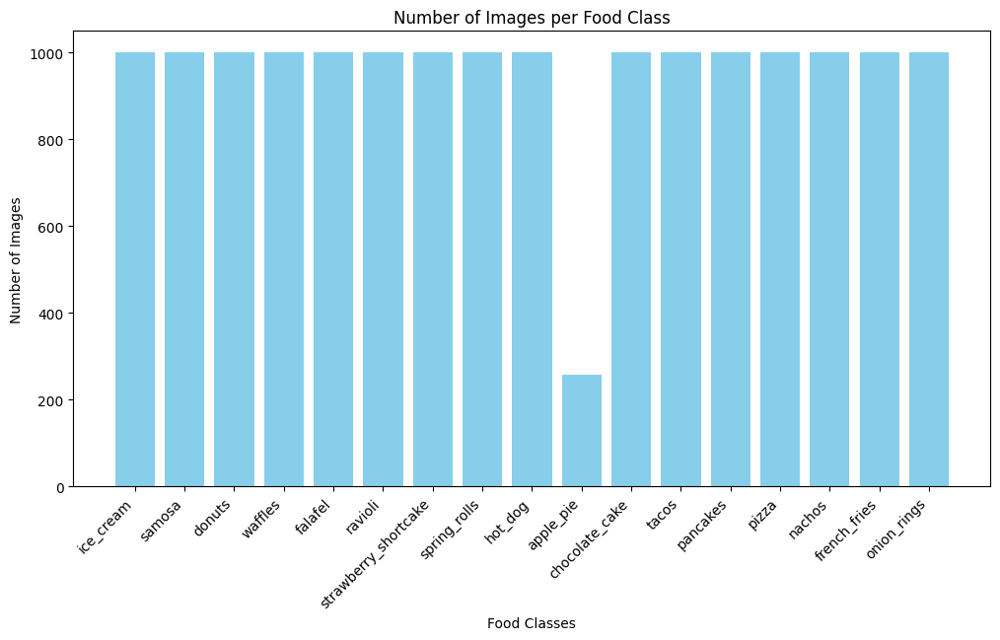

In [25]:
# 1. Class Distribution Plot
classes = list(class_to_images.keys())
counts = [len(imgs) for imgs in class_to_images.values()]

plt.figure(figsize=(12, 6))
plt.bar(classes, counts, color='skyblue')
plt.xticks(rotation=45, ha='right')
plt.xlabel('Food Classes')
plt.ylabel('Number of Images')
plt.title('Number of Images per Food Class')
plt.show()

**Observation:**
- Most classes contain **exactly 1,000 images**, which is ideal for training.
- Only one class (`apple_pie`) has significantly fewer images (257) — this may lead to **class imbalance** during training.
- Dataset is well-suited for image classification tasks.

#### **Image Size Analysis (width and height)**

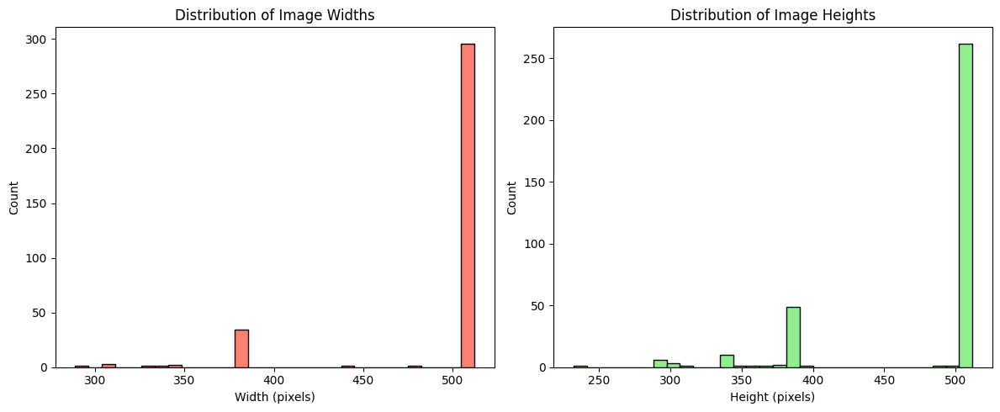

In [27]:
# Image Size Analysis (width and height)
import random
from PIL import Image
widths, heights = [], []

for cls, images in class_to_images.items():
    sample_images = random.sample(images, min(20, len(images)))  # sample 20 images per class
    for img_name in sample_images:
        img_path = os.path.join(base_path, cls, img_name)
        with Image.open(img_path) as img:
            w, h = img.size
            widths.append(w)
            heights.append(h)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(widths, bins=30, color='salmon', edgecolor='black')
plt.title('Distribution of Image Widths')
plt.xlabel('Width (pixels)')
plt.ylabel('Count')

plt.subplot(1, 2, 2)
plt.hist(heights, bins=30, color='lightgreen', edgecolor='black')
plt.title('Distribution of Image Heights')
plt.xlabel('Height (pixels)')
plt.ylabel('Count')

plt.tight_layout()
plt.show()


**Image Size Distribution Observation**

- **Most images are 512x512 pixels**.
   - This indicates the dataset is already quite standardized.

- **A few images have smaller dimensions** (e.g., 300, 350 pixels).
   - These are outliers and occur rarely.

- **This consistency is useful for model training**.
   - We can resize all images to 512x512 or a smaller fixed size (like 224x224) for deep learning models.

- **No very large or very small images** were found.
   - This ensures minimal image distortion during preprocessing.


#### **Visualize the data, showing one image per class from 101 classes**

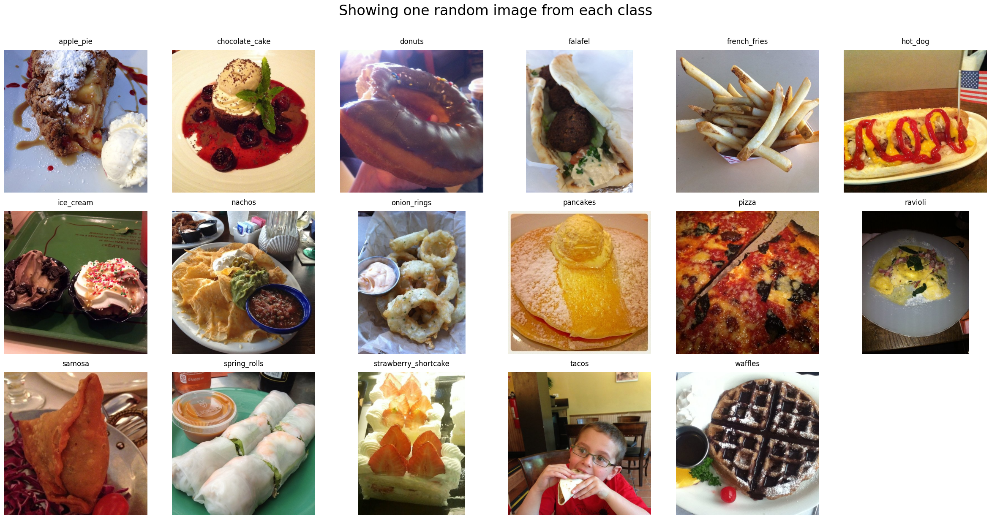

In [34]:
# Visualize the data, showing one image per class from 101 classes
# Path to dataset
data_dir = food101_dir  # Assuming `food101_dir` is already defined
foods_sorted = sorted(os.listdir(data_dir))

# Total number of classes
num_classes = len(foods_sorted)

# Dynamically define grid size
cols = 6
rows = int(np.ceil(num_classes / cols))

# Create subplots
fig, ax = plt.subplots(rows, cols, figsize=(4 * cols, 4 * rows))
fig.suptitle("Showing one random image from each class", y=1.02, fontsize=24)

# Flatten axes for easier iteration (in case rows * cols > num_classes)
ax = ax.flatten()

for food_id, food_name in enumerate(foods_sorted):
    food_images = os.listdir(os.path.join(data_dir, food_name))
    random_img = np.random.choice(food_images)
    img_path = os.path.join(data_dir, food_name, random_img)
    img = plt.imread(img_path)

    ax[food_id].imshow(img)
    ax[food_id].set_title(food_name, pad=10)
    ax[food_id].axis('off')

# Hide any extra axes if there are unused subplots
for i in range(num_classes, len(ax)):
    ax[i].axis('off')

plt.tight_layout()
plt.subplots_adjust(top=0.93)  # Leave room for suptitle
plt.show()


## **Step 2: Map training and testing images to its classes.**

In [36]:
from sklearn.model_selection import train_test_split
# Adjust path as needed
base_path = 'food101_data/Food_101'

# Get class names from folder names
class_names = sorted([folder for folder in os.listdir(base_path) if os.path.isdir(os.path.join(base_path, folder))])

data = []

# Collect image path and class label
for label in class_names:
    folder_path = os.path.join(base_path, label)
    for img_file in os.listdir(folder_path):
        if img_file.lower().endswith(('.jpg', '.jpeg', '.png')):
            img_path = os.path.join(folder_path, img_file)
            data.append((img_path, label))

# Create DataFrame
df = pd.DataFrame(data, columns=['image_path', 'label'])

# Split into train/test (80/20)
train_df, test_df = train_test_split(df, test_size=0.2, stratify=df['label'], random_state=42)

print("✅ Mapped images to classes.")
print(f"Train: {len(train_df)} images, Test: {len(test_df)} images")
train_df.head()


✅ Mapped images to classes.
Train: 13004 images, Test: 3252 images


,image_path,label
2230,food101_data/Food_101/donuts/2249805.jpg,donuts
12195,food101_data/Food_101/samosa/1145678.jpg,samosa
13392,food101_data/Food_101/strawberry_shortcake/225...,strawberry_shortcake
13828,food101_data/Food_101/strawberry_shortcake/354...,strawberry_shortcake
10269,food101_data/Food_101/ravioli/788592.jpg,ravioli


In [37]:
test_df.head()

,image_path,label
14294,food101_data/Food_101/tacos/912275.jpg,tacos
12771,food101_data/Food_101/spring_rolls/887749.jpg,spring_rolls
15913,food101_data/Food_101/waffles/2748580.jpg,waffles
48,food101_data/Food_101/apple_pie/3639398.jpg,apple_pie
2701,food101_data/Food_101/falafel/2322834.jpg,falafel


## **Step 3: Create annotations for training and testing images.**

[Take any 10 foods(class) of your choice and select any 50 images inside each food and create the annotations manually.
You can use any image annotation tool to get the coordinates.]

**Image Annotation Overview:**

To train a model for object detection (such as YOLO, SSD, or Faster R-CNN), we’ve created annotations for selected food classes. These annotations are saved in a CSV file and follow a structured format suitable for model training.

**Annotation Task Details**

We selected 10 food classes of our choice. wihch is
  - French Fries
  - Apple Pie
  - Nachos
  - Pizza
  - Pancakes
  - Tacos
  - Chocolate Cake
  - Hot Dog
  - Onion Rings
  - Spring Roll

For each food class, we manually annotated 50-60 images.

We used an image annotation tool(Roboflow) to mark bounding boxes (object locations).

The annotation data is saved in a file:
Datasetv1/original_images/_annotations.csv

**Annotation File Structure:**

The CSV file contains the following columns:

| **Column** | **Description** |
|------------|-----------------|
| `filename` | Name of the image file (e.g., `pizza_01.jpg`) |
| `width`    | Width of the image in pixels |
| `height`   | Height of the image in pixels |
| `class`    | Name of the object class (e.g., `pizza`, `samosa`, etc.) |
| `xmin`     | X-coordinate of the top-left corner of the bounding box |
| `ymin`     | Y-coordinate of the top-left corner of the bounding box |
| `xmax`     | X-coordinate of the bottom-right corner of the bounding box |
| `ymax`     | Y-coordinate of the bottom-right corner of the bounding box |

This format is commonly used in object detection datasets to describe the position and size of objects within each image.


**File & Folder Paths:**

Below are the paths used for image data and annotations:

- **Path to the annotation file**  
  `Datasetv1/original_images/_annotations.csv`

- **Folder containing the corresponding images**  
  `Datasetv1/original_images/`




## **Step 4: Display images with bounding box you have created manually in the previous step.**

In [46]:
# Path to the CSV file containing image annotations (e.g., bounding boxes, labels)
csv_path = 'Datasetv1/original_images/_annotations.csv'

# Path to the folder where the original images are stored
img_folder = 'Datasetv1/original_images/'

In [47]:
# Load annotations
df = pd.read_csv(csv_path)

In [48]:
df.head()  # Display the first 5 rows of the DataFrame

,filename,width,height,class,xmin,ymin,xmax,ymax
0,2909830_jpg.rf.bb9125215f38f22139f72d04f19e693...,512,512,Apple Pie,210,43,397,259
1,108743_jpg.rf.260978b4f8ae78f4ebb41f48ef501679...,512,384,French Fries,50,3,442,383
2,149278_jpg.rf.86187fd5bd1698133cb7a973c6060449...,512,384,French Fries,33,0,260,167
3,2986199_jpg.rf.ac0b99e71100520e6608ef72b12ee27...,512,512,Apple Pie,28,37,291,233
4,2934928_jpg.rf.c8f427a0d3e7ba9342fe37276fb15ab...,512,512,Apple Pie,9,54,463,465


In [51]:
def show_bboxes(df, n=5, classes_to_show=None):
    # Filter by class if specified
    if classes_to_show:
        #classes_to_show = [cls.lower().replace(" ", "_") for cls in classes_to_show]
        #df['class'] = df['class'].str.lower()
        filtered_df = df[df['class'].isin(classes_to_show)]
        if filtered_df.empty:
            print(f"⚠️ No images found for classes: {classes_to_show}")
            return
    else:
        filtered_df = df

    img_files = filtered_df['filename'].unique()
    total = min(n, len(img_files))

    # Prepare grid layout (e.g., 5 images in 1 row)
    fig, axes = plt.subplots(1, total, figsize=(5 * total, 5))

    # If only one image, axes is not iterable
    if total == 1:
        axes = [axes]

    for idx in range(total):
        img_file = img_files[idx]
        img_path = os.path.join(img_folder, img_file)
        if not os.path.exists(img_path):
            print(f"❌ Image not found: {img_path}")
            continue

        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️ Unable to read image: {img_file}")
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax = axes[idx]
        ax.imshow(img_rgb)

        # Draw all boxes for the current image
        for _, row in filtered_df[filtered_df['filename'] == img_file].iterrows():
            x_min, y_min, x_max, y_max = int(row['xmin']), int(row['ymin']), int(row['xmax']), int(row['ymax'])
            label = row['class']
            rect = patches.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
            ax.text(x_min, y_min - 5, label, color='red', fontsize=10, backgroundcolor='white')

        ax.axis('off')
        ax.set_title(f"{img_file}", fontsize=10)

    plt.tight_layout()
    plt.show()


In [52]:
# Print all unique food class names in the dataset
print(df['class'].unique())


['Apple Pie' 'French Fries' 'pancakes' 'tacos']


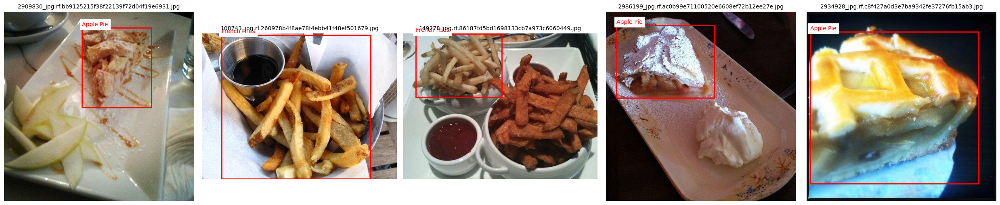

In [53]:
# Show 5 images with boxes only for 'Apple Pie'
show_bboxes(df, n=5)

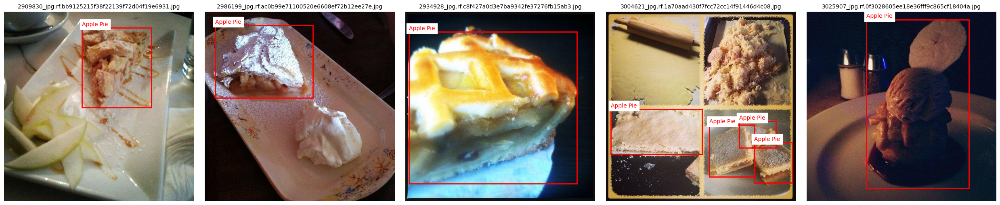

In [54]:
# Show 5 images with boxes only for 'Apple Pie'
show_bboxes(df, n=5, classes_to_show=['Apple Pie'])

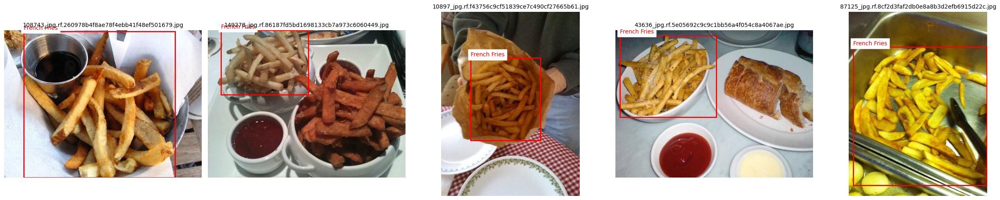

In [55]:
# Show 5 images with boxes only for 'French Fries'
show_bboxes(df, n=5, classes_to_show=['French Fries'])

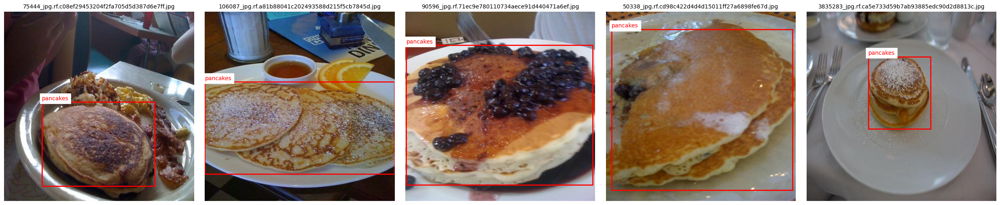

In [56]:
# Show 5 images with boxes only for 'pancakes'
show_bboxes(df, n=5, classes_to_show=['pancakes'])


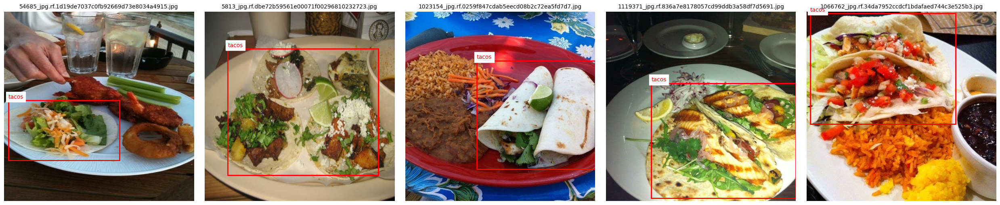

In [57]:
# Show 5 images with boxes only for 'tacos'
show_bboxes(df, n=5, classes_to_show=['tacos'])

## **Step 5: Design, train and test basic CNN models to classify the flood.**

### **Step 5.1.1: Load & Preprocess Data**


In [45]:
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.image import img_to_array

# Load annotations
df = pd.read_csv('Datasetv1/original_images/_annotations.csv')

# We'll use only one row per image since classification doesn’t need boxes
df = df.drop_duplicates(subset=['filename', 'class'])

# Encode class labels
class_names = sorted(df['class'].unique())
class_to_idx = {cls: idx for idx, cls in enumerate(class_names)}
df['label'] = df['class'].map(class_to_idx)

# Load images and labels
img_folder = 'Datasetv1/original_images/'
images, labels = [], []

for _, row in df.iterrows():
    path = os.path.join(img_folder, row['filename'])
    img = cv2.imread(path)
    if img is not None:
        img = cv2.resize(img, (128, 128))  # Resize to fixed size
        img = img_to_array(img) / 255.0
        images.append(img)
        labels.append(row['label'])

X = np.array(images)
y = to_categorical(labels, num_classes=len(class_names))

# Split into train and test
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42)


### **Step 5.1.2: Build a Basic CNN**

In [48]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.layers import Input

model = Sequential([
    Input(shape=(128, 128, 3)),  # Explicit input layer
    Conv2D(32, (3, 3), activation='relu'),
    MaxPooling2D((2,2)),
    
    Conv2D(64, (3,3), activation='relu'),
    MaxPooling2D((2,2)),

    Conv2D(128, (3,3), activation='relu'),
    MaxPooling2D((2,2)),

    Flatten(),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dense(len(class_names), activation='softmax')
])
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 126, 126, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 63, 63, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 61, 61, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 28, 28, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 14, 14, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 25088)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 128)            │     3,211,392 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │           516 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,305,156 (12.61 MB)

 Trainable params: 3,305,156 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

### **5.1.3: Train the Model**

In [49]:
history = model.fit(X_train, y_train, epochs=10, batch_size=16, validation_split=0.2)

Epoch 1/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 71ms/step - accuracy: 0.2850 - loss: 1.5045 - val_accuracy: 0.1765 - val_loss: 1.4117
Epoch 2/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.2882 - loss: 1.3809 - val_accuracy: 0.2059 - val_loss: 1.4052
Epoch 3/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.3763 - loss: 1.3274 - val_accuracy: 0.2353 - val_loss: 1.3932
Epoch 4/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.5489 - loss: 1.2310 - val_accuracy: 0.2941 - val_loss: 1.4260
Epoch 5/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.5460 - loss: 1.0900 - val_accuracy: 0.2647 - val_loss: 1.9294
Epoch 6/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - accuracy: 0.5881 - loss: 0.9299 - val_accuracy: 0.2059 - val_loss: 1.8582
Epoch 7/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.6326 - loss: 0.8553 - val_accuracy: 0.2647 - val_loss: 1.8731
Epoch 8/10
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step - accuracy: 0.7645 - loss: 0.5693 - val_accuracy: 0.2647 - val_loss: 2.1725


In [50]:
loss, acc = model.evaluate(X_test, y_test)
print(f"✅ Test Accuracy: {acc*100:.2f}%")


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step - accuracy: 0.3368 - loss: 2.0510
✅ Test Accuracy: 33.33%


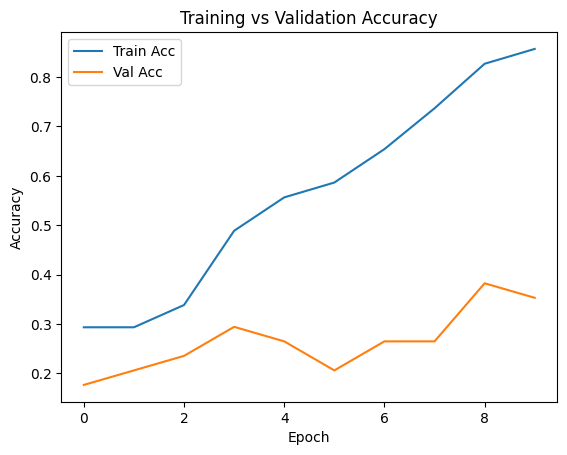

In [51]:
import matplotlib.pyplot as plt

plt.plot(history.history['accuracy'], label='Train Acc')
plt.plot(history.history['val_accuracy'], label='Val Acc')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training vs Validation Accuracy')
plt.legend()
plt.show()


In [89]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np


In [90]:
y_pred_probs = model.predict(X_test)  # Assuming model output is softmax
y_pred = np.argmax(y_pred_probs, axis=1)  # Get class indices


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step 


2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
✅ Classification Report:
              precision    recall  f1-score   support

         0.0       0.32      0.60      0.41        10
         1.0       0.38      0.30      0.33        10
         2.0       0.38      0.42      0.40        12
         3.0       0.00      0.00      0.00        10

    accuracy                           0.33        42
   macro avg       0.27      0.33      0.29        42
weighted avg       0.27      0.33      0.29        42



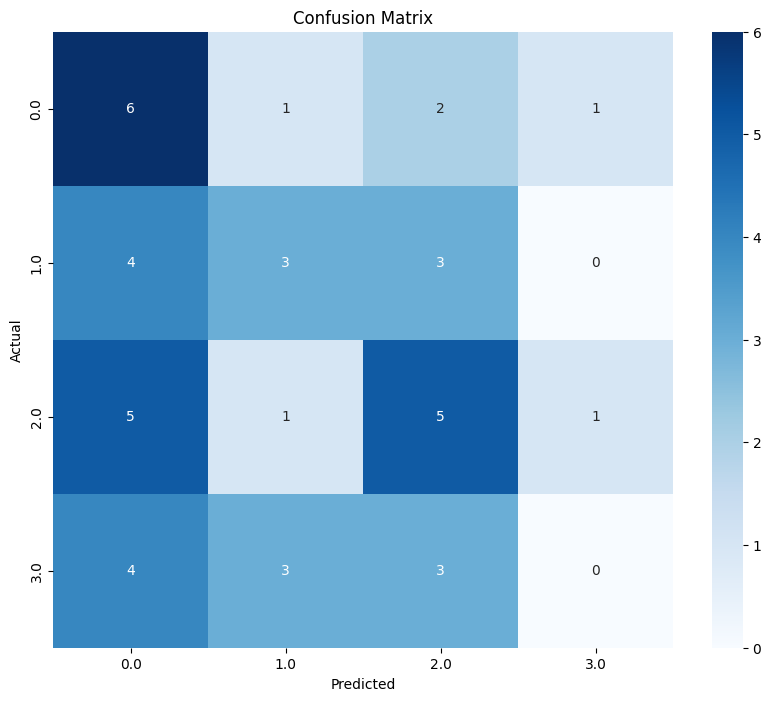

In [52]:
import numpy as np
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Predict class probabilities
y_pred_probs = model.predict(X_test)

# Step 2: Get predicted class indices
y_pred_class = np.argmax(y_pred_probs, axis=1)

# Step 3: Convert y_test to class indices if it's one-hot encoded
if y_test.ndim > 1 and y_test.shape[1] > 1:
    y_test_class = np.argmax(y_test, axis=1)
else:
    y_test_class = y_test.ravel().astype(int)

# Step 4: Fit LabelEncoder on all classes (train + test) to avoid unseen labels
all_labels = np.concatenate([y_train.ravel(), y_test_class])
label_encoder = LabelEncoder()
label_encoder.fit(all_labels)

# Step 5: Decode to original class names
y_test_labels = label_encoder.inverse_transform(y_test_class.astype(int))
y_pred_labels = label_encoder.inverse_transform(y_pred_class.astype(int))

# Step 6: Classification report
print("✅ Classification Report:")
print(classification_report(y_test_labels, y_pred_labels))

# Step 7: Confusion Matrix
conf_mat = confusion_matrix(y_test_labels, y_pred_labels, labels=label_encoder.classes_)

# Step 8: Plot Confusion Matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', xticklabels=label_encoder.classes_,
            yticklabels=label_encoder.classes_, cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()
